In [1]:
import numpy as np, xarray as xr, matplotlib.pylab as plt, pandas as pd, seaborn as sns
import pickle, random, re, io, regionmask, dask, timeit, os, shutil, datetime
from scipy.signal import welch; from eofs.xarray import Eof; import matplotlib as mpl

from statsmodels.tsa.api import VAR; from contextlib import redirect_stdout
from distributed import Client; from scipy import stats
import cartopy.crs as ccrs, cartopy.feature as cfeature
import matplotlib.gridspec as gridspec; import cartopy.feature as cfeature
from matplotlib.colors import Normalize; import matplotlib.pyplot as plt
import warnings; warnings.filterwarnings('ignore')

from InVERT_functions import (calc_weights, concat_with_monthids, calc_EOFs, areaweighted_mean, 
autocorr, unstack_time, stack_time, createRandomSortedList, compare_T_pdfs, calc_psd_stats, 
plot_GMST_psd_spread, calc_emean_autocorrs, calc_ensemble_std_autocorrs, calc_efold_time, 
calc_eft_stats, compare_autocorrs_emean, plot_GMST_comparisons, save_region_means,
plot_regional_psd_spread, plot_regional_T_pdfs, plot_regional_emean_autocorrs, 
plot_regional_comparison, find_var_name, compare_MSE_to_emean_PSD, welch_psd, get_ensemble_variance, 
calc_emean_gridcell_MSE, plot_regional_variance_stats, plot_regional_eft_stats,
gridcell_map_plot, plot_gridcell_diff, plot_regional_diff_map, calc_gridcell_psd, plot_MSE_by_region,
calc_efold_time_dataset, plot_var_coeffs, convert_lon, emulate_pcs, plot_local_monthly_T_stds,
calc_gridcell_monthly_autocorrs)

In [2]:
scenario = 'Historical'

savepath = '/home/msaenger/InVERT/output/' # Directory where InVERT output and training EOF data is saved
    
lpath = '/home/msaenger/LENS2_' + scenario + '/TREFHT/' # Directory where LENS2 training data is saved

In [3]:
n_samples = 25   # number of InVERT ensemble members to generate
n_steps = 1980   # number of time steps (months) to generate per InVERT ensemble member 
optimal_lag = 12 # VAR model lag (months)

nmodes = 100    # number of EOF modes to include
M = 120          # Number of initial time steps (months) to truncate for spin-up (aka 'burn-in' period)

In [4]:
LENS_esize = 50  # Size of LENS ensemble (number of members)

In [5]:
# Figure formatting
mpl.rcParams['font.family'] = 'sans-serif' # Change the default font family
tickfontsize = 14; axislabelfontsize=16
titlefontsize=18; legendfontsize=14
color1 = 'goldenrod'; color2='teal'

In [6]:
if scenario == 'Historical':
    scenario_name = 'HIST'
else: scenario_name = scenario

In [7]:
## Randomly select a subset of ensemble members train on

n_training_members = 25 # Number of training ensemble members to use

In [11]:
print('\n Diagnostics \n')

## Load saved InVERT output for diagnostics
InVERT_T = xr.open_dataset(savepath + 'InVERT_'+str(nmodes)+'modes.nc')

## Concatenate emulated ensemble members in time
InVERT_stacked = xr.open_dataset(savepath + 'InVERT_' + str(nmodes) + 'modes_stacked.nc')


 Diagnostics 



In [12]:
## Load LENS2 testing ensemble T anomaly data

## stacked in time
Tanoms_lens = xr.open_dataset(savepath + 'LENS2_concatted_Tanoms_25_testing_members.nc')

## separate back into ensemble members
T_unstacked = unstack_time(Tanoms_lens, esize=LENS_esize//2)

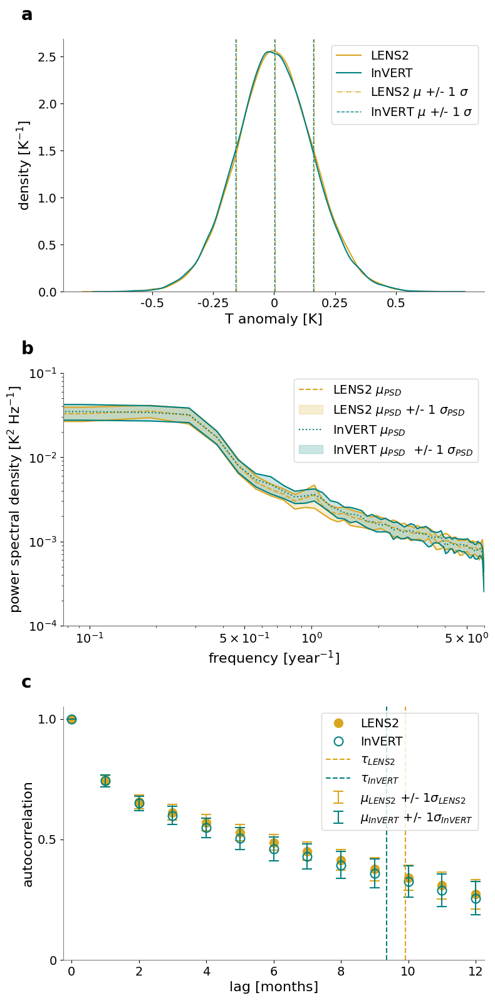

In [13]:
## Figure 2 (GMST pdf, psd, and lag autocorrelations)

titlefontsize=20
plot_GMST_comparisons(T_unstacked, InVERT_T, Tanoms_lens, InVERT_stacked,
                      'LENS2', 'InVERT', color1, color2, savepath, 
                      save_name='Figure_2_subplots_Historical')

In [13]:
## Save AR6 regional mean data

# ## Testing data (stacked in time) 
save_region_means(Tanoms_lens, name='LENS2_'+scenario+'_stacked', path=savepath)

# ## Testing data unstacked 
save_region_means(T_unstacked, name='LENS2_'+scenario, path=savepath)

In [14]:
## Emulated data (stacked in time)
save_region_means(InVERT_stacked, name='InVERT_'+scenario+'_stacked', path=savepath)

## Emulated data (not stacked in time)
save_region_means(InVERT_T, name='InVERT_'+scenario, path=savepath)

In [15]:
## Load AR6 regional mean data 

## LENS
T_regional_stacked = xr.open_dataset(savepath + \
            'LENS2_'+scenario+'_stacked_AR6_region_mean_Tanoms.nc')
## LENS
T_regional = xr.open_dataset(savepath + 'LENS2_'+scenario+'_AR6_region_mean_Tanoms.nc')

In [16]:
## INVERT
InVERT_regional_stacked = xr.open_dataset(savepath + \
                               'InVERT_'+scenario+'_stacked_AR6_region_mean_Tanoms.nc')

## InVERT
InVERT_regional = xr.open_dataset(savepath + \
                        'InVERT_'+scenario+'_AR6_region_mean_Tanoms.nc')

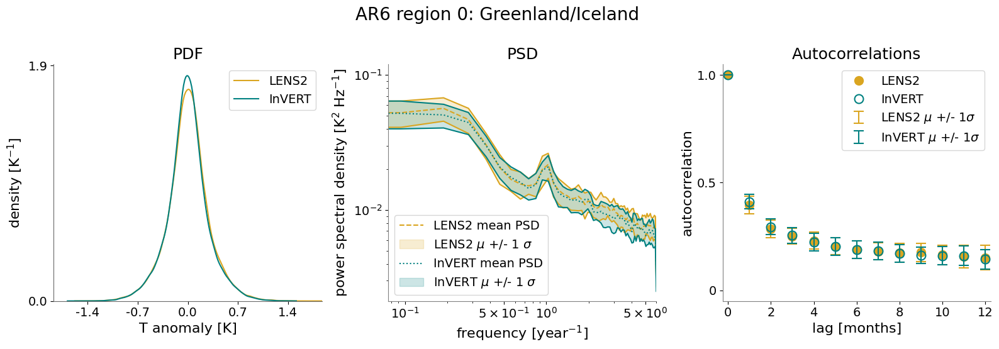

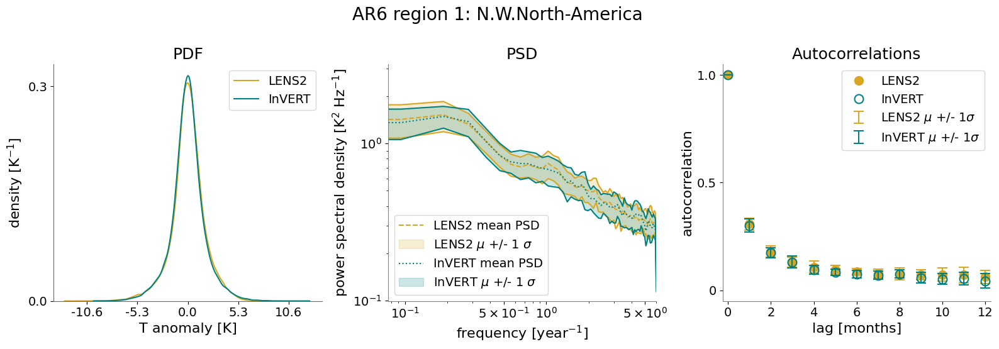

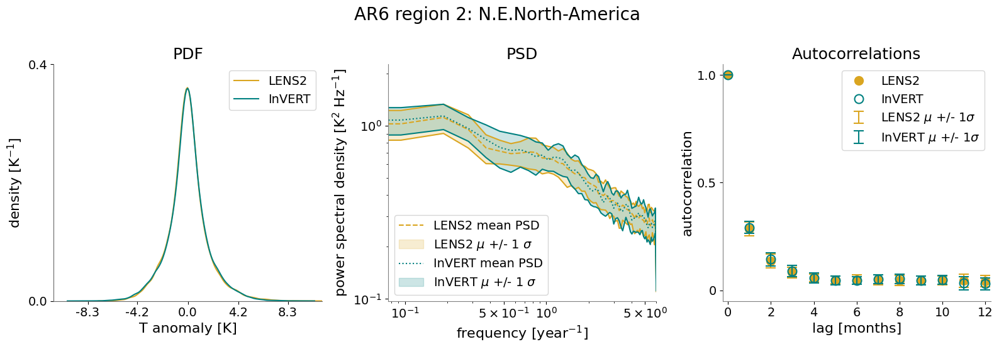

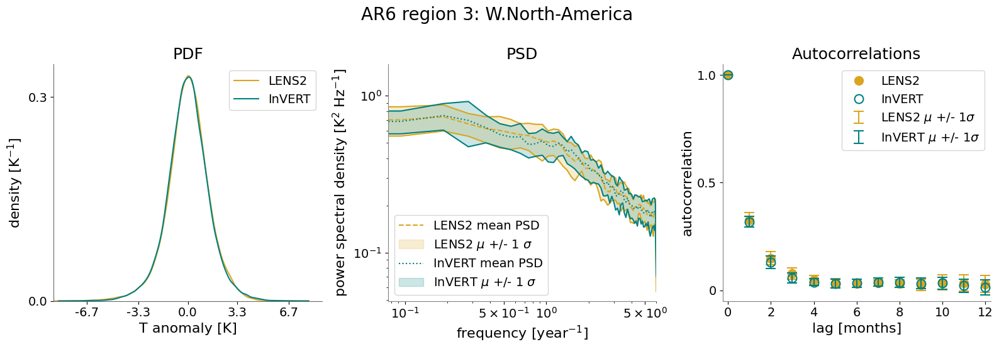

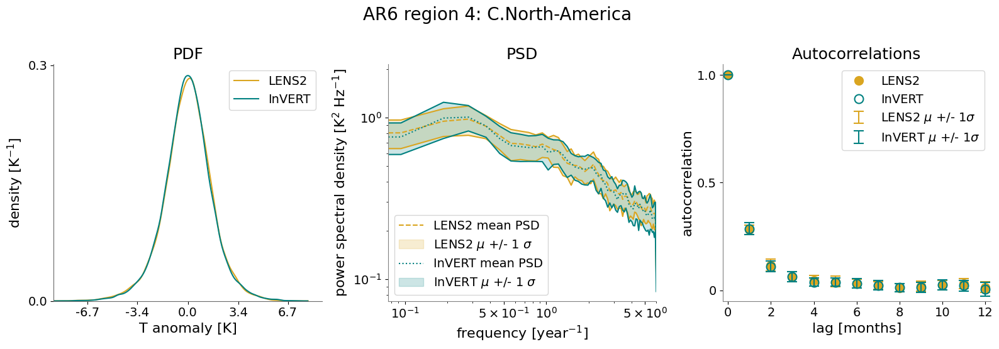

...

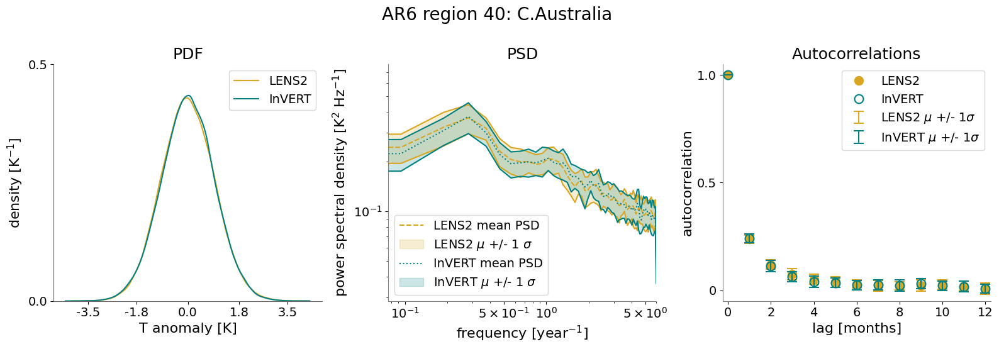

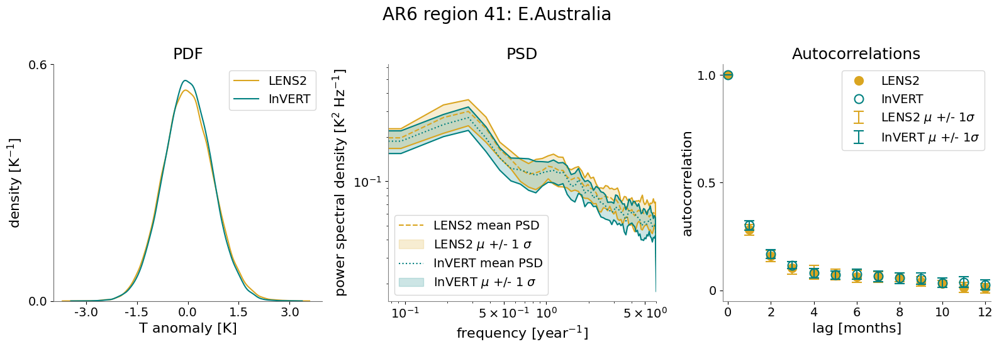

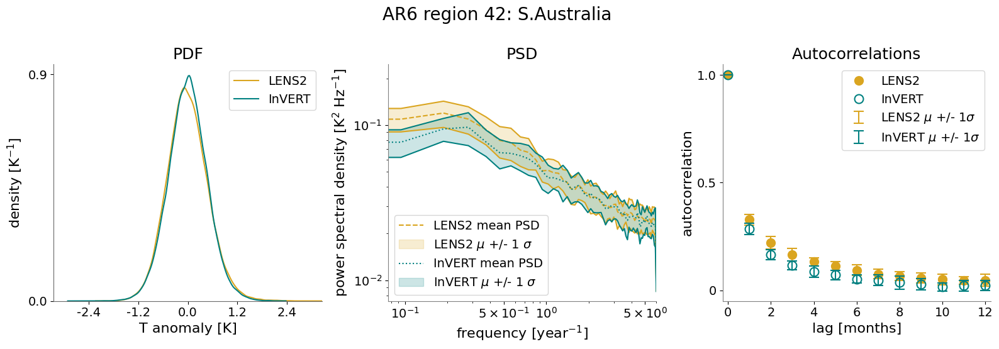

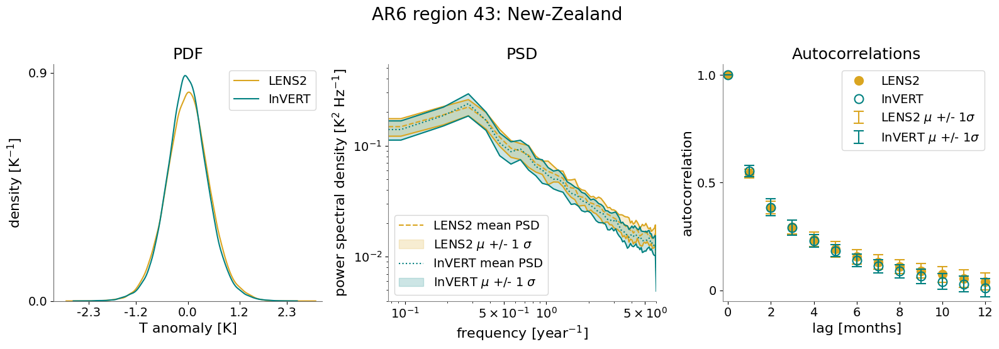

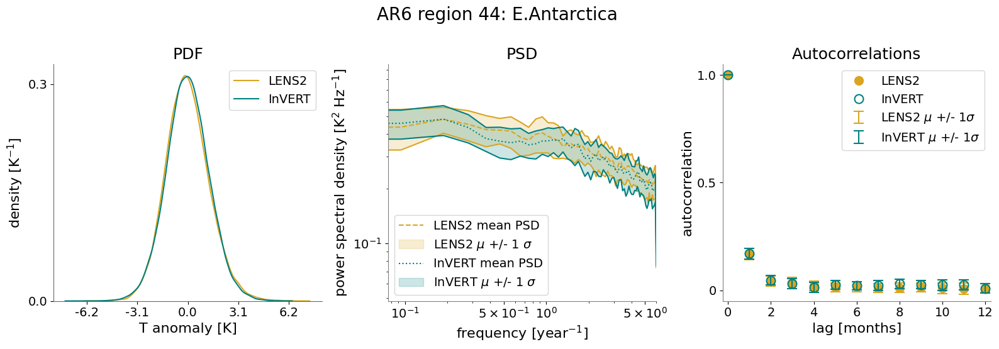

In [17]:
## Plot region mean pdf, psd, and autocorrelations for each AR6 region

for region in range(45):
    plot_regional_comparison(T_regional, InVERT_regional, 
                             T_regional_stacked, InVERT_regional_stacked, 
                             region, name1='LENS2', name2='InVERT',
                             color1=color1, color2=color2)

In [18]:
## Compute ensemble mean and std of PSD of GMST anomaly at each frequency

f, mean_psd, std_psd = calc_psd_stats(T_unstacked.gmean)
invert_f, invert_mean_psd, invert_std_psd = calc_psd_stats(InVERT_T.gmean)

In [19]:
# t test on mean of spectral power at each frequency
print('Compare ensemble means of power at each f \n pvalue = ', 
        np.round(stats.ttest_ind(mean_psd, invert_mean_psd).pvalue, 3))

# t test on standard deviation of spectral power at each frequency
print('\nCompare ensemble stds of power at each f \n pvalue = ', 
        np.round(stats.ttest_ind(std_psd, invert_std_psd).pvalue, 3))

# t test on variance of spectral power at each frequency
print('\nCompare ensemble variances of power at each f \n pvalue = ',
        np.round(stats.ttest_ind(std_psd**2, invert_std_psd**2).pvalue, 3))

Compare ensemble means of power at each f 
 pvalue =  0.96

Compare ensemble stds of power at each f 
 pvalue =  0.906

Compare ensemble variances of power at each f 
 pvalue =  0.832


In [20]:
## Compare global mean and stds of variances of global mean T anomalies

stds = T_unstacked.gmean.std('time'); stds_invert = InVERT_T.gmean.std('time')

means = T_unstacked.gmean.mean('time'); means_invert = InVERT_T.gmean.mean('time')

variances = T_unstacked.gmean.var('time'); variances_invert = InVERT_T.gmean.var('time')

print('p value: variances of global mean T anomalies', 
       np.round(stats.ttest_ind(variances, variances_invert).pvalue, 3))
print('p value: means of GMST anoms', 
       np.round(stats.ttest_ind(means, means_invert).pvalue, 3))
print('p value: standard deviations of GMST anoms', 
       np.round(stats.ttest_ind(stds, stds_invert).pvalue, 3))

p value: variances of global mean T anomalies 0.796
p value: means of GMST anoms 0.448
p value: standard deviations of GMST anoms 0.779


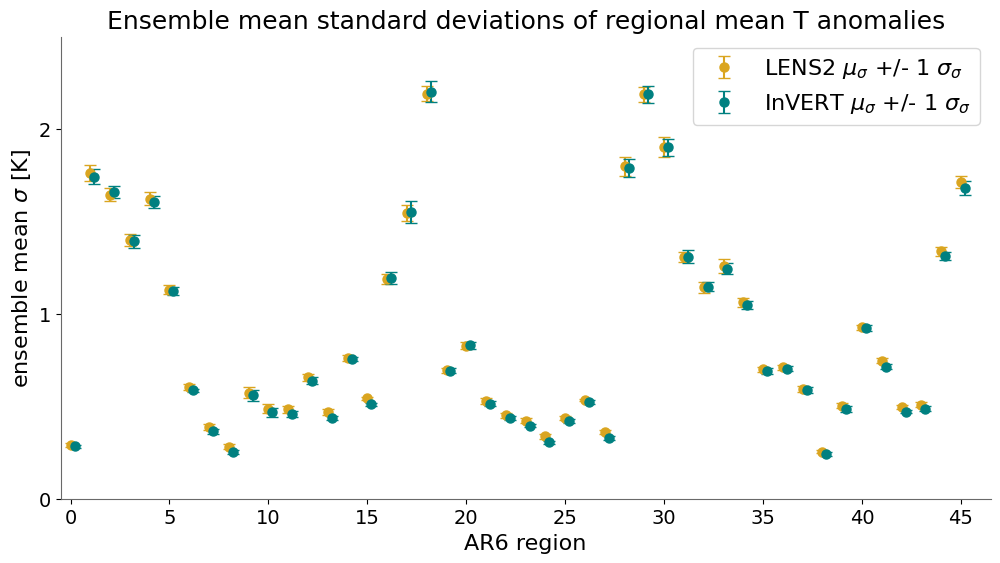

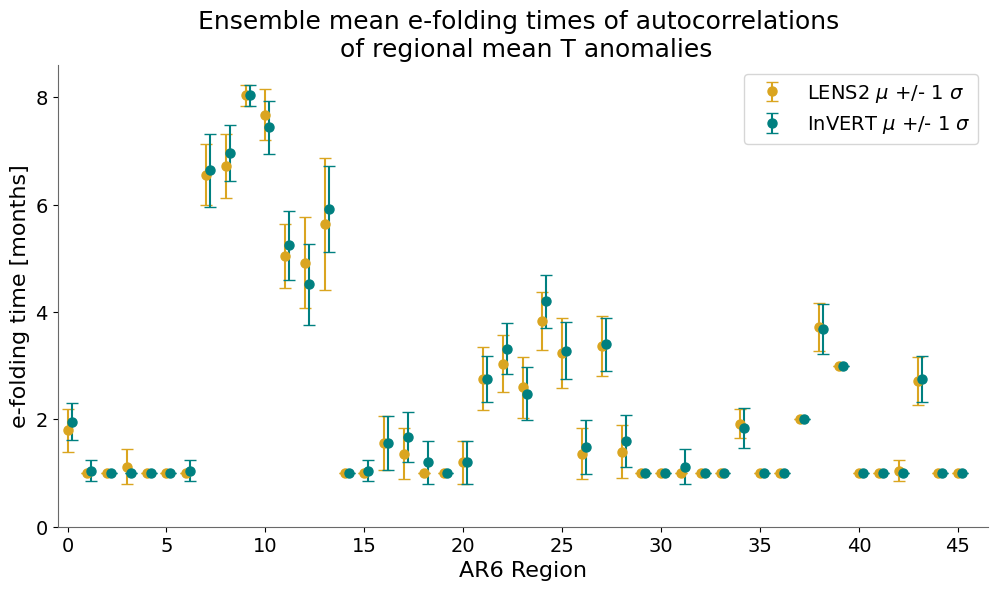

In [21]:
## Compare statistics by AR6 region

## Figure S4: Ensemble mean standard deviations of T anomalies by AR6 region (LENS2 Historical)
plot_regional_variance_stats(T_regional, InVERT_regional, color1, color2, 'std', savepath, 'LENS2 ', 'InVERT ');

region_mean_efts_lens, region_mean_efts_invert = plot_regional_eft_stats(T_regional, InVERT_regional, 
                                                                         savepath, color1, color2,
                                                                         'LENS2 ', 'InVERT ');

## Map plots

In [22]:
## Calculate gridcell standard deviations of T anomaly data, by ensemble member

## InVERT
std_invert = InVERT_T.T.std('time') 
## save as netcdf
std_invert.to_netcdf(savepath + 'std_invert.nc'); 

In [23]:
## LENS
std_lens = T_unstacked.anoms.std('time') 
## save as netcdf
std_lens.to_netcdf(savepath + 'std_lens.nc')

In [24]:
## Load gridcell T anomaly standard deviations 
std_invert = xr.open_dataarray(savepath + 'std_invert.nc')
std_lens = xr.open_dataarray(savepath + 'std_lens.nc')

In [25]:
## Compute ensemble mean standard deviations at each gridcell
emean_std_invert = std_invert.mean('ensemble')
emean_std_lens = std_lens.mean('ensemble')

In [26]:
## Compute gridcell PSD of each and save as netcdf
LENS_grid_psd = calc_gridcell_psd(T_unstacked.anoms)
LENS_grid_psd.to_netcdf(savepath + 'LENS_gridcell_psd.nc')

In [27]:
InVERT_grid_psd = calc_gridcell_psd(InVERT_T.T)
InVERT_grid_psd.to_netcdf(savepath + 'InVERT_gridcell_psd.nc')

In [28]:
## Load gridcell PSDs 
LENS_grid_psd = xr.open_dataset(savepath + 'LENS_gridcell_psd.nc')
InVERT_grid_psd = xr.open_dataset(savepath + 'InVERT_gridcell_psd.nc')

In [29]:
## Compute ensemble mean MSE of PSDs at each gridcell
grid_emean_mse = calc_emean_gridcell_MSE(LENS_grid_psd, InVERT_grid_psd)

In [30]:
## Compute e-folding times of T anomalies at every gridcell and save
print('computing gridcell e-folding times (LENS)')
LENS_gridcell_tau = calc_efold_time_dataset(find_var_name(T_unstacked))
LENS_gridcell_tau.to_netcdf(savepath + 'LENS_gridcell_efoldingtimes.nc')

computing gridcell e-folding times (LENS)


In [31]:
print('computing gridcell e-folding times (InVERT)')
InVERT_gridcell_tau = calc_efold_time_dataset(find_var_name(InVERT_T))
InVERT_gridcell_tau.to_netcdf(savepath + 'InVERT_gridcell_efoldingtimes.nc')

computing gridcell e-folding times (InVERT)


In [32]:
## Load saved gridcell autocorrelation e-folding times
efts_invert = xr.open_dataarray(savepath + 'InVERT_gridcell_efoldingtimes.nc')
efts_lens = xr.open_dataarray(savepath + 'LENS_gridcell_efoldingtimes.nc')

In [33]:
## Compile data for Figure 3 map plots

shrink = 0.78 ## fraction for size of colorbar
## ds1: gridcell % difference STD (top left fig 3 subplot)
vmin_pct_std, vmax_pct_std, img, ds1 = plot_gridcell_diff(D1=emean_std_lens, D2=emean_std_invert,
                                            stat='standard deviation', difference='percent',
                                            ax=None, fig=None, shrink = shrink, colorbar=False);
plt.clf();

## ds2: regional percent difference STD (top right fig 3 subplot)
ds2 = plot_regional_diff_map(T_regional, InVERT_regional, ds_gridded=InVERT_T,
                               difference='percent', stat='std', vmin=0, vmax = 30, 
                               ax=None, fig=None, shrink=shrink, colorbar=False); plt.clf();

## ds3: gridcell absolute difference STD (bottom left subplot)
vmin_pct_std, vmax_pct_std, img, ds3 = plot_gridcell_diff(D1=emean_std_lens, D2=emean_std_invert,
                                                stat='standard deviation', difference='absolute',
                                                ax=None, fig=None, shrink = shrink, colorbar=True,
                                                find_vlims=False, vmin=-0.6, vmax=0.6);  plt.clf();
## ds4: gridcell PSD (bottom middle)
ds4 = grid_emean_mse

## ds5: gridcell absolute difference e-folding time (bottom right)
ds5 = efts_lens.mean('ensemble') - efts_invert.mean('ensemble')

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

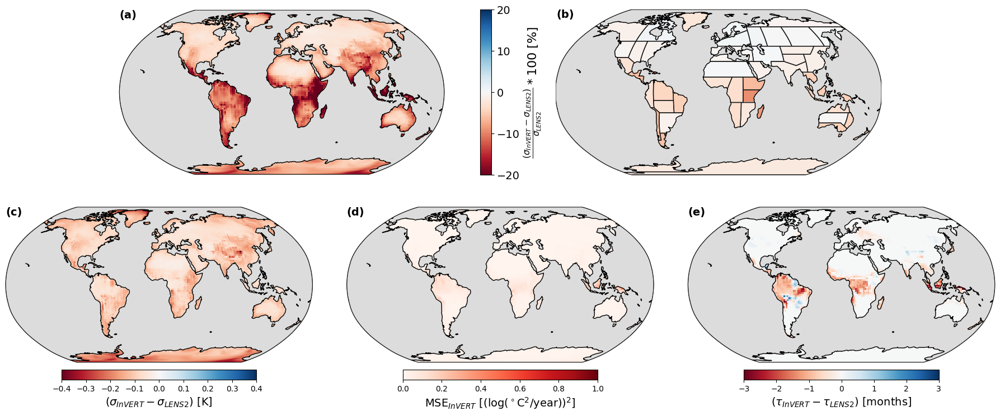

In [34]:
## Plot maps of gridcell and regional differences between InVERT and LENS2 (figure 3)

fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(20, 8),
                         subplot_kw={'projection': ccrs.Robinson()})
fig.delaxes(axes[0, 2])  # Remove extra subplot in first row 

## First row (2 subplots)
ax = axes[0,0]
im1 = ax.pcolormesh(ds1['lon'], ds1['lat'], ds1.values, transform=ccrs.PlateCarree(), 
                    cmap='RdBu', vmin=-20, vmax=20) 

ax = axes[0, 1]
im2 = axes[0, 1].pcolormesh(ds2['lon'], ds2['lat'], ds2.values, transform=ccrs.PlateCarree(),
                            cmap='RdBu', vmin=-20, vmax=20)
## Get AR6 land regions
regions = regionmask.defined_regions.ar6.land
## Plot AR6 region boundaries 
regions.plot(ax=ax, add_ocean=True, ocean_kws={'facecolor': 'lightgray'}, label='number',
             text_kws={'visible':False}, line_kws={'lw':1}) # linewidth of region boundaries

ax = axes[1,0]
im3 = ax.pcolormesh(ds3['lon'], ds3['lat'], ds3.values, transform=ccrs.PlateCarree(),
                    cmap='RdBu', vmin=-0.4, vmax=0.4)

ax = axes[1,1]
im4 = ax.pcolormesh(ds4['lon'], ds4['lat'], ds4.values, transform=ccrs.PlateCarree(),
                    cmap='Reds', vmin=0, vmax=1)

ax = axes[1,2]
im5 = ax.pcolormesh(ds5['lon'], ds5['lat'], ds5.values, transform=ccrs.PlateCarree(), 
                    cmap='RdBu', vmin=-3, vmax=3)

for ax in [axes[0,0], axes[0,1], axes[1,0], axes[1,1], axes[1,2]]:
    ax.stock_img() # Add stock image to mask ocean
    ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='black', facecolor='gainsboro')

fig.subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95,
                    wspace=0.05, hspace=0.1) # Reduce  spacing between subplots
                      
## Increase horizontal space between top two subplots center them in the top row
extra_space = 0.1  # Adjust this value to control the extra space
## Get the original positions of both top subplots
pos1 = axes[0, 0].get_position(); pos2 = axes[0, 1].get_position()
## Calculate total width of top two subplots plus extra space
total_width = pos1.width + pos2.width + extra_space
## Calculate starting position to center top 2 subplots
start_position = (1 - total_width) / 2  # 1 represents the total figure width
## Shift left subplot to starting position
axes[0, 0].set_position([start_position, pos1.y0, pos1.width, pos1.height])
## Shift right subplot to the right of left subplot with extra space
axes[0, 1].set_position([start_position + pos1.width + extra_space, pos2.y0, pos2.width, pos2.height])

## Recompute colorbar center position 
left_edge = axes[0, 0].get_position().x1; right_edge = axes[0, 1].get_position().x0
center_position = (left_edge + right_edge) / 2

cbar_ax = fig.add_axes([center_position - 0.018, 
                        axes[0, 1].get_position().y0, 0.01,
                        axes[0, 1].get_position().height])
fig.colorbar(im1, cax=cbar_ax, orientation='vertical') 

## Add subplot labels
axes[0, 0].text(0.00, 1.00, '(a)', transform=axes[0, 0].transAxes, fontsize=14, fontweight='bold', va='top')
axes[0, 1].text(0.00, 1.00, '(b)', transform=axes[0, 1].transAxes, fontsize=14, fontweight='bold', va='top')
axes[1, 0].text(0.00, 1.00, '(c)', transform=axes[1, 0].transAxes, fontsize=14, fontweight='bold', va='top')
axes[1, 1].text(0.00, 1.00, '(d)', transform=axes[1, 1].transAxes, fontsize=14, fontweight='bold', va='top')
axes[1, 2].text(0.00, 1.00, '(e)', transform=axes[1, 2].transAxes, fontsize=14, fontweight='bold', va='top')

## Adjust tick parameters for vertical color bar:
cb_vert = fig.colorbar(im1, cax=cbar_ax, orientation='vertical')
cb_vert.ax.tick_params(labelsize=14)

## Adjust font size of labels for bottom row colorbars 
for ax in axes[1,:]: # get axes for colorbars in the bottom row

    if ax == axes[1,0]:
        cb = plt.colorbar(im3, ax=ax, orientation='horizontal', shrink=0.6, pad=0.04)
        cb.set_label(label=r'($\sigma_{InVERT}-\sigma_{LENS2}$) [K]', size=14)  
        
    if ax == axes[1,1]:
        cb = plt.colorbar(im4, ax=ax, orientation='horizontal', shrink=0.6, pad=0.04)
        cb.set_label(label='MSE$_{InVERT}$ [(log($^\circ$C$^{2}$/year))$^{2}$]', size=14)  
        
    if ax == axes[1,2]:
        cb = plt.colorbar(im5, ax=ax, orientation='horizontal', shrink=0.6, pad=0.04,)
        cb.set_label(label=r'$(\tau_{InVERT} - \tau_{LENS2})$ [months]', size=14)  
        
## Adjust label for the vertical colorbar:
cb_vert.set_label(label=r'$\frac{(\sigma_{InVERT}-\sigma_{LENS2})}{\sigma_{LENS2}}*100$ [%]', 
                  size=16)
plt.show()
fig.savefig(savepath + 'Figure_3_maps_'+scenario+'.pdf'); 
fig.savefig(savepath + 'Figure_3_maps_'+scenario+'.png'); 

In [35]:
## Figure S3 - regionally aggregated InVERT performance
## (a) regional STD absolute difference; (b) regional MSE; (c) regional EFT absolute difference

## Regional MSE: LENS  vs InVERT ensemble mean PSD
regional_MSEs_dict_InVERT_vs_LENS = {}

for region in range(46):    
    mses = compare_MSE_to_emean_PSD(tseries_1 = find_var_name(T_regional).sel(mask=region), 
                                   tseries_2 = find_var_name(InVERT_regional).sel(mask=region))
    regional_MSEs_dict_InVERT_vs_LENS[region] = mses 

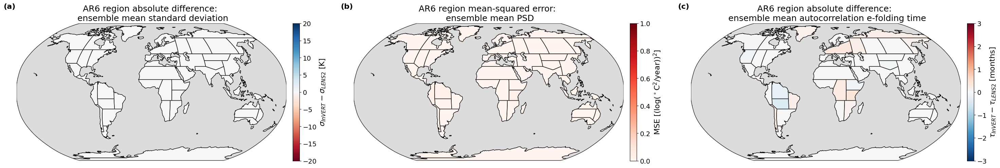

In [36]:
## Desired subplot sizes (in inches)
subplot_widths = [10, 10, 10]  # Widths for the 3 columns
subplot_heights = [5.5]  # Heights for the one row

## Calculate figure size
fig_width = sum(subplot_widths); fig_height = sum(subplot_heights) 

## Create figure
fig = plt.figure(figsize=(fig_width, fig_height))
gs = gridspec.GridSpec(1, 3, figure=fig, width_ratios=subplot_widths, height_ratios=subplot_heights)

shrink = 0.78 # colorbar size fraction

## Create axes objects
axes = [fig.add_subplot(gs[i, j], projection=ccrs.Robinson()) for i in range(1) for j in range(3)]

## Add subplot labels
subplot_labels = ['(a)', '(b)', '(c)']
for i, ax in enumerate(axes):
    ax.text(-0.05, 1.15, subplot_labels[i], transform=ax.transAxes,  
            fontsize=16, fontweight='bold', va='top', ha='left', zorder=10)
    
## Left Subplot
plot_regional_diff_map(T_regional, InVERT_regional, ds_gridded=InVERT_T,
                        difference='absolute', stat='std', vmin=-20, 
                       vmax=20, ax=axes[0], fig=fig, shrink=shrink)   
    
## Middle Subplot
plot_MSE_by_region(regional_MSEs_dict_InVERT_vs_LENS,
                   cbar_label='MSE [(log($^\circ$C$^{2}$/year))$^{2}$]',
                   title="AR6 region mean-squared error: \n ensemble mean PSD",
                   ds_gridded=InVERT_T, vmin=0, vmax=1, ax=axes[1], fig=fig, shrink=shrink)

## Right Subplot
plot_regional_diff_map(region_mean_efts_lens, region_mean_efts_invert, InVERT_T,
                       'absolute', 'eft', vmin=-3, vmax=3, ax=axes[2], 
                       fig=fig, shrink=shrink, cmap='RdBu_r')

plt.tight_layout(); plt.show()

fig.savefig(savepath + 'Figure_S3_regional_maps_'+scenario+'.pdf'); 
fig.savefig(savepath + 'Figure_S3_regional_maps_'+scenario+'.png')

In [37]:
## Seasonal plots

## Convert lon from 0-360 to -180 - 180
InVERT_T_converted_lon = convert_lon(InVERT_stacked, 'lon')
Tanoms_lens_converted_lon = convert_lon(Tanoms_lens, 'lon')

In [38]:
## Define seasons
seasonal_months = {'DJF': [12, 1, 2], 'MAM': [3, 4, 5],
                   'JJA': [6, 7, 8], 'SON': [9, 10, 11]}

## Compute seasonal standard deviations for LENS and InVERT
seasonal_std_lens = {}
seasonal_std_invert = {}
for season, months in seasonal_months.items():
    ## Select data for current season based on 'month' coordinate
    seasonal_data_lens = Tanoms_lens_converted_lon.anoms.sel(
        time=Tanoms_lens_converted_lon['month'].isin(months))
    seasonal_data_invert = InVERT_T_converted_lon.T.sel(
        time=InVERT_T_converted_lon['month'].isin(months))    
    
    ## Compute std over time dimension for the selected season
    seasonal_std_lens[season] = seasonal_data_lens.std(dim='time')
    seasonal_std_invert[season] = seasonal_data_invert.std(dim='time')

print("Seasonal standard deviations calculated.")

Seasonal standard deviations calculated.


In [39]:
## Calculate seasonal differences in standard deviation between InVERT and LENS
seasonal_diff = {}
for season in seasonal_months.keys():
    seasonal_diff[season] = seasonal_std_invert[season] - seasonal_std_lens[season]
    
seasonal_pct_diff = {}
for season in seasonal_months.keys():
    seasonal_pct_diff[season] = (seasonal_std_invert[season] - \
                                 seasonal_std_lens[season]) / seasonal_std_lens[season] * 100 

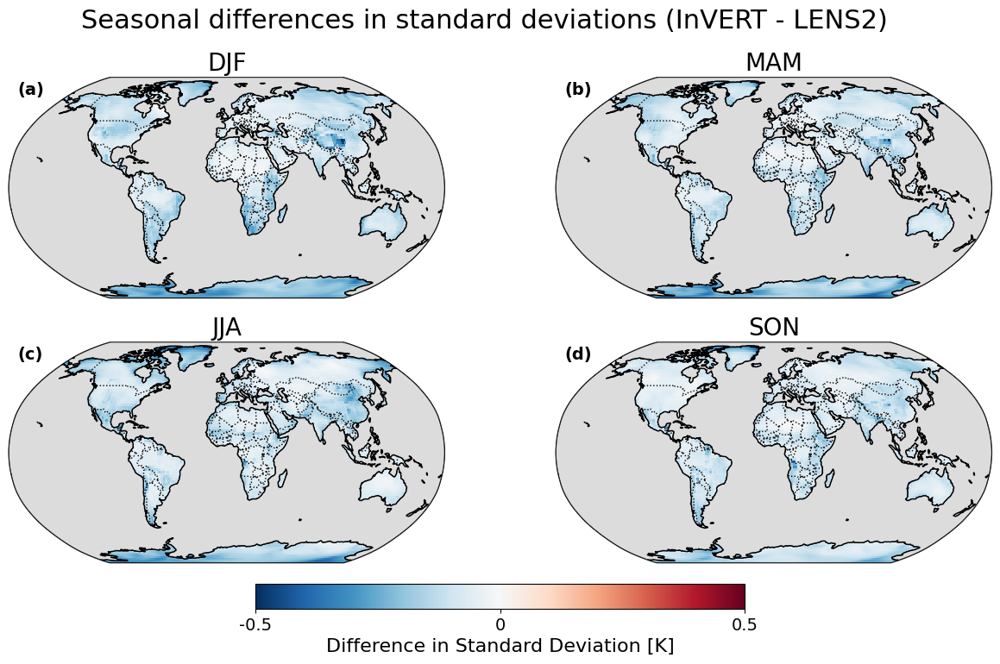

In [40]:
## Figure S8: Maps of seasonal differences in standard deviations between InVERT and LENS2 Historical.

fig = plt.figure(figsize=(15, 8)) 
gs = gridspec.GridSpec(2, 2, figure=fig)

## Create axes for 2x2 grid
ax_djf = fig.add_subplot(gs[0, 0], projection=ccrs.Robinson())
ax_mam = fig.add_subplot(gs[0, 1], projection=ccrs.Robinson())
ax_jja = fig.add_subplot(gs[1, 0], projection=ccrs.Robinson())
ax_son = fig.add_subplot(gs[1, 1], projection=ccrs.Robinson())

axes = {'DJF': ax_djf, 'MAM': ax_mam, 'JJA': ax_jja, 'SON': ax_son}

## Determine a common colorbar range 
vmax = 0.5; vmin = -vmax; cmap = 'RdBu_r' 

## Add subplot labels
subplot_labels = ['(a)', '(b)', '(c)', '(d)']
label_idx = 0

## Plot each seasonal difference map
for season, ax in axes.items():
    
    data = seasonal_diff[season]

    im = ax.pcolormesh(data['lon'], data['lat'], data.values,
                       transform=ccrs.PlateCarree(),
                       cmap=cmap, vmin=vmin, vmax=vmax)

    ax.set_title(season, fontsize=titlefontsize)
    ax.coastlines(); ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.stock_img(); ax.add_feature(cfeature.OCEAN, zorder=100, 
                        edgecolor='black', facecolor='gainsboro')

    ## Add subplot label
    ax.text(0.02, 0.98, subplot_labels[label_idx], transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', zorder=10)
    label_idx += 1

## Add a single colorbar at the bottom
cbar = fig.colorbar(im, ax=axes.values(), orientation='horizontal', 
             fraction=0.046, pad=0.04)# , label='Difference in Standard Deviation [K]')
cbar.set_label('Difference in Standard Deviation [K]', fontsize=axislabelfontsize)
cbar.ax.tick_params(labelsize=tickfontsize)

## Set custom tick labels for colorbar
cbar_ticks = [ -0.5, 0, 0.5]
cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([str(tick) for tick in cbar_ticks])

plt.suptitle('Seasonal differences in standard deviations (InVERT - LENS2)',
             fontsize=22);

plt.savefig(savepath + 'Figure_S8_seasonal_std_differences.pdf')
plt.savefig(savepath + 'Figure_S8_seasonal_std_differences.png')

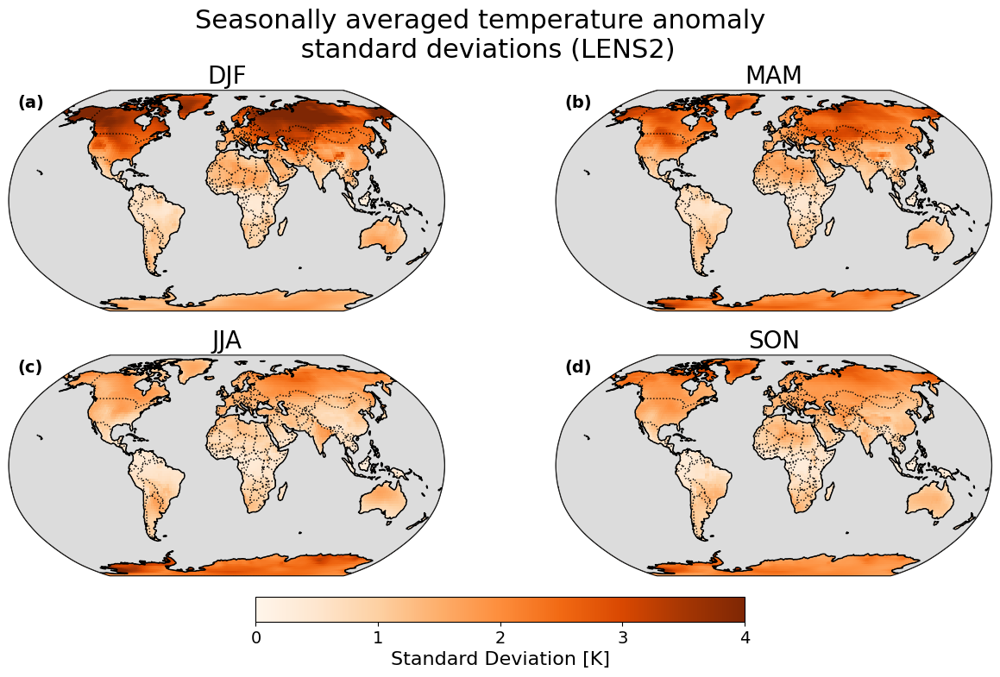

In [41]:
## Figure S7 - Maps of seasonal standard deviations of temperature anomalies (LENS2 Historical) 

## LENS seasonal T anomaly standard deviations
fig = plt.figure(figsize=(15, 8)) 
gs = gridspec.GridSpec(2, 2, figure=fig)

## Create axes for 2x2 grid
ax_djf = fig.add_subplot(gs[0, 0], projection=ccrs.Robinson())
ax_mam = fig.add_subplot(gs[0, 1], projection=ccrs.Robinson())
ax_jja = fig.add_subplot(gs[1, 0], projection=ccrs.Robinson())
ax_son = fig.add_subplot(gs[1, 1], projection=ccrs.Robinson())

axes = {'DJF': ax_djf, 'MAM': ax_mam, 'JJA': ax_jja, 'SON': ax_son}

vmax = 4; vmin = 0 # Common colorbar range
cmap = 'Oranges' # Common colormap

## Add subplot labels
subplot_labels = ['(a)', '(b)', '(c)', '(d)']
label_idx = 0

for season, ax in axes.items():
    
    data = seasonal_std_lens[season]
    im = ax.pcolormesh(data['lon'], data['lat'], data.values,
                       transform=ccrs.PlateCarree(),
                       cmap=cmap, vmin=vmin, vmax=vmax)

    ax.set_title(season, fontsize=titlefontsize)
    ax.coastlines(); ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.stock_img(); ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='black', 
               facecolor='gainsboro')

    ## Add subplot label
    ax.text(0.02, 0.98, subplot_labels[label_idx], transform=ax.transAxes,
            fontsize=14, fontweight='bold', va='top', zorder=10)
    label_idx += 1

## Add a single colorbar at the bottom
cbar = fig.colorbar(im, ax=axes.values(), orientation='horizontal', 
             fraction=0.046, pad=0.04, label='Standard Deviation [K]')
cbar.set_label('Standard Deviation [K]', fontsize=axislabelfontsize)
cbar.ax.tick_params(labelsize=tickfontsize)

## Set custom tick labels for the colorbar
cbar_ticks = [0, 1, 2, 3, 4]; cbar.set_ticks(cbar_ticks)
cbar.set_ticklabels([str(tick) for tick in cbar_ticks])

plt.suptitle('Seasonally averaged temperature anomaly \n standard deviations (LENS2)',
             fontsize=22, y=0.999);
plt.savefig(savepath + 'Figure_S7_seasonal_stds_LENS.pdf')
plt.savefig(savepath + 'Figure_S7_seasonal_stds_LENS.png')

In [43]:
# ## Load EOF solvers by month from training ensemble members

solvers_bymonth = {}
for month in range(1,13):
    solvers_bymonth[month] = calc_EOFs(0, path=savepath, filename='LENS2_'+scenario_name + \
                                       '_monthly_Tanom_EOFs_month='+str(month))
    
    ## Extract and save PCs, EOFs, and variance fractions from the EOF solver object

eofs_dict = {}
for month in range(1, 13):
    eofs_dict[month] = {}
    eofs_dict[month]['eofs'] = solvers_bymonth[month].eofs().sel(mode=slice(0, nmodes-1))
    eofs_dict[month]['pcs'] = solvers_bymonth[month].pcs().sel(mode=slice(0, nmodes-1))
    eofs_dict[month]['varfracs'] = solvers_bymonth[month].varianceFraction().sel(mode=slice(0, nmodes-1))
    
## Extract cos(lat) weights for later use

weights = solvers_bymonth[1].getWeights()
weights = xr.DataArray(weights, coords=[eofs_dict[1]['eofs']['lat'], 
                                        eofs_dict[1]['eofs']['lon']], 
                       dims=['lat', 'lon'])

Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver


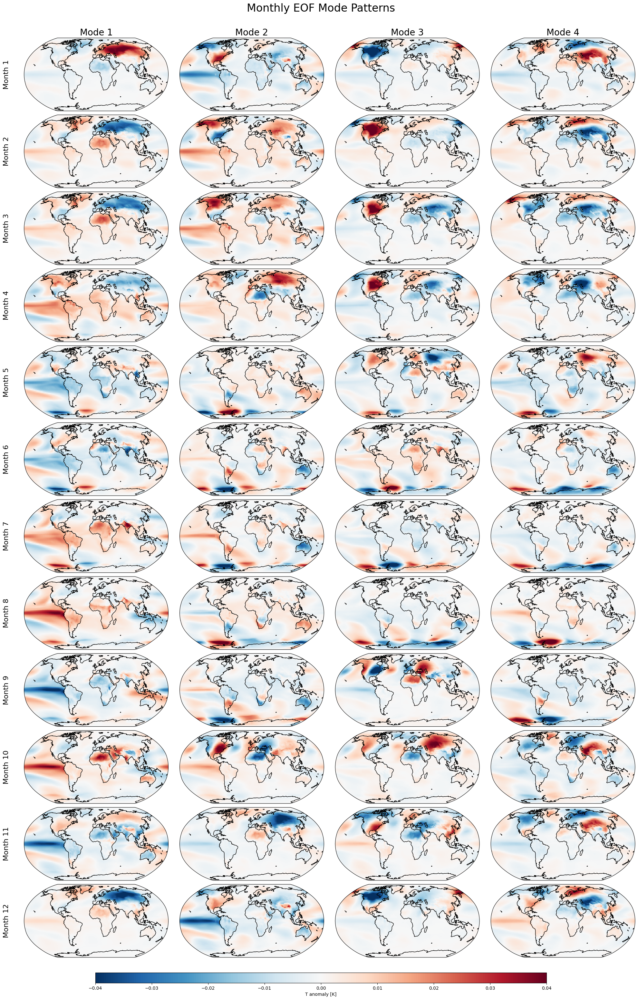

In [44]:
## Monthly EOF mode patterns

## Figure S5: Month-specific EOF mode patterns – first four modes for each (LENS2 Historical)

## Set the number of months (rows) and modes (columns) 
num_months = 12; num_modes_to_plot = 4

fig, axes = plt.subplots(nrows=num_months, ncols=num_modes_to_plot,
                figsize=(20, 32), subplot_kw={'projection': ccrs.Robinson()})

for month in range(1, num_months + 1): # Iterate through each month (rows)
    for mode_idx in range(num_modes_to_plot): # Iterate through each mode (columns)
        ax = axes[month - 1, mode_idx] # Swapped indexing

        # Select EOF data for current month and mode
        eof_data = eofs_dict[month]['eofs'].sel(mode=mode_idx)

        # Plot EOF pattern
        im = ax.pcolormesh(eof_data['lon'], eof_data['lat'], eof_data.values,
                           transform=ccrs.PlateCarree(), cmap='RdBu_r', 
                           vmin=-0.04, vmax=0.04)
        ax.coastlines()

        if month == 1: # Title for first row (months)
            ax.set_title(f'Mode {mode_idx + 1}', fontsize=titlefontsize)
        if mode_idx == 0: # Label for first column (modes)
            ax.text(-0.1, 0.5, f'Month {month}', va='center', ha='right',
                rotation='vertical', transform=ax.transAxes, fontsize=axislabelfontsize)
              
cbar_ax = fig.add_axes([0.15, 0.05, 0.7, 0.01])  # Add a colorbar axis: [left,  bottom, width, height]   
cbar_ax = fig.colorbar(im, cax=cbar_ax, orientation='horizontal',
                       shrink=0.2, label='T anomaly [K]')
cbar.ax.tick_params(labelsize=tickfontsize+4)
cbar.set_label('T anomaly [K]', fontsize=axislabelfontsize+4)

plt.tight_layout(rect=[0, 0.07, 1, 0.98])
plt.suptitle('Monthly EOF Mode Patterns', y=1.0, fontsize=titlefontsize+4)
plt.show()

fig.savefig(savepath + 'Figure_S5_month_eof_patterns_'+scenario+'.png'); 
fig.savefig(savepath + 'Figure_S5_month_eof_patterns_'+scenario+'.pdf')

In [45]:
## Plot local monthly standard deviations for a selection of highly populated cities

## Convert longitude for ensemble-separated datasets
InVERT_T_converted_lon = convert_lon(InVERT_T, 'lon')
LENS_converted_lon = convert_lon(T_unstacked, 'lon')

In [46]:
## Calculate ensemble mean standard deviations of T anomalies by month

LENS_emean_monthly_stds = LENS_converted_lon.anoms.groupby('month').std('time').mean('ensemble')
InVERT_emean_monthly_stds = InVERT_T_converted_lon.T.groupby('month').std('time').mean('ensemble')

In [47]:
## Calculate ensemble standard deviation of T anomaly standard deviations by month

LENS_estd_monthly_stds = LENS_converted_lon.anoms.groupby('month').std('time').std('ensemble')
InVERT_estd_monthly_stds = InVERT_T_converted_lon.T.groupby('month').std('time').std('ensemble')

New York City, United States: 40.1029793042494, -73.125
Beijing, China: 40.1029793042494, 116.25
New Delhi, India: 28.91149236871774, 76.875
Cairo, Egypt: 30.77674406172325, 31.875


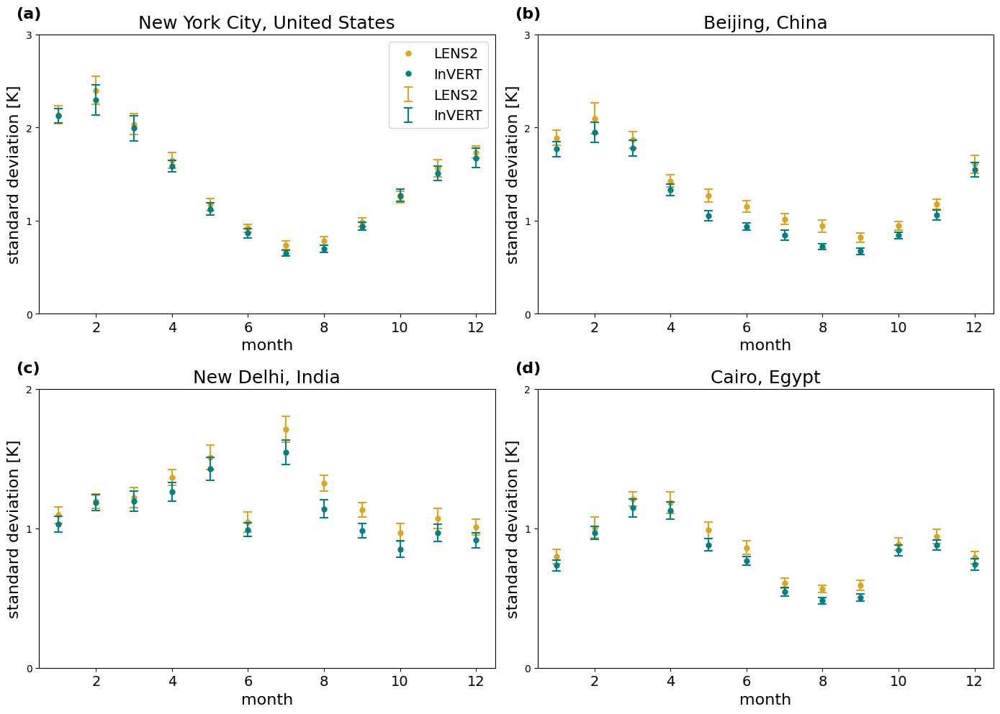

In [48]:
locations_lat_lon = [(40.7, -74, 'New York City, United States'),
                     (39.9, 116.4, 'Beijing, China'),
                     (28.7, 77.2, 'New Delhi, India'),
                     (30.05, 31.23, 'Cairo, Egypt' )]

plot_local_monthly_T_stds(LENS_emean_monthly_stds, InVERT_emean_monthly_stds,
                          LENS_estd_monthly_stds, InVERT_estd_monthly_stds,
                          locations_lat_lon, savepath, ylim=[3,3,2,2],
                          save_name='Figure_4_'+scenario+'_monthly_stds',
                          name1='LENS2', name2='InVERT')

In [49]:
def compare_T_pdfs(t1, t2, name1, name2, color1, color2, title,
                   tickfontsize = 14, axislabelfontsize=16,
                   titlefontsize=18, legendfontsize=14, ax=None, log_scale=False):
    '''
    Global mean pdf with option to plot on log scale
    '''
    sns.kdeplot(t1, color=color1, label=name1, ax=ax)
    sns.kdeplot(t2, color=color2, label=name2, ax=ax)
    ax.set_xlabel('T anomaly [K]', fontsize=axislabelfontsize)
    ax.set_ylabel('density [K$^{-1}$]', fontsize=axislabelfontsize)

    t1_std_range = np.array([t1.mean().values-t1.std().values,
                             t1.mean().values+t1.std().values])
    t2_std_range = np.array([t2.mean().values-t2.std().values,
                             t2.mean().values+t2.std().values])
    ymin, ymax = ax.get_ylim()  # Get current y-axis limits

    ax.axvline(t1.mean(), color=color1, linestyle='dashdot', linewidth=1,
               label=name1 + ' $\mu$ +/- 1 $\sigma$')
    ax.axvline(t2.mean(), color=color2, linestyle='--', linewidth=1,
               label=name2 + ' $\mu$ +/- 1 $\sigma$')

    ax.axvline(t1.mean()+t1.std(), color=color1, linestyle='dashdot', linewidth=1)
    ax.axvline(t2.mean()+t2.std(), color=color2, linestyle='--', linewidth=1)
    ax.axvline(t1.mean()-t1.std(), color=color1, linestyle='dashdot', linewidth=1)
    ax.axvline(t2.mean()-t2.std(), color=color2, linestyle='--', linewidth=1)

    xticks = [-0.75, -.5, -.25, 0, .25, .5, 0.75]
    ax.set_xticks(xticks, labels=xticks, fontsize=tickfontsize)
    yticks = [0.0, 0.5, 1.0, 1.5, 2.0, 2.5]
    ax.set_yticks(yticks, labels=yticks, fontsize=tickfontsize)
    ax.spines['top'].set_visible(False); ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_color('dimgrey'); ax.spines['left'].set_color('dimgrey')
    
    ax.set_title(title, fontsize=titlefontsize)
    ax.legend(fontsize=legendfontsize)

    if log_scale:
        ax.set_yscale('log')
    ax.set_ylim(ymin, ymax)
        
    plt.savefig(savepath + 'Figure_S19_GMST_PDF_log_scale.pdf')
    plt.savefig(savepath + 'Figure_S19_GMST_PDF_log_scale.png')

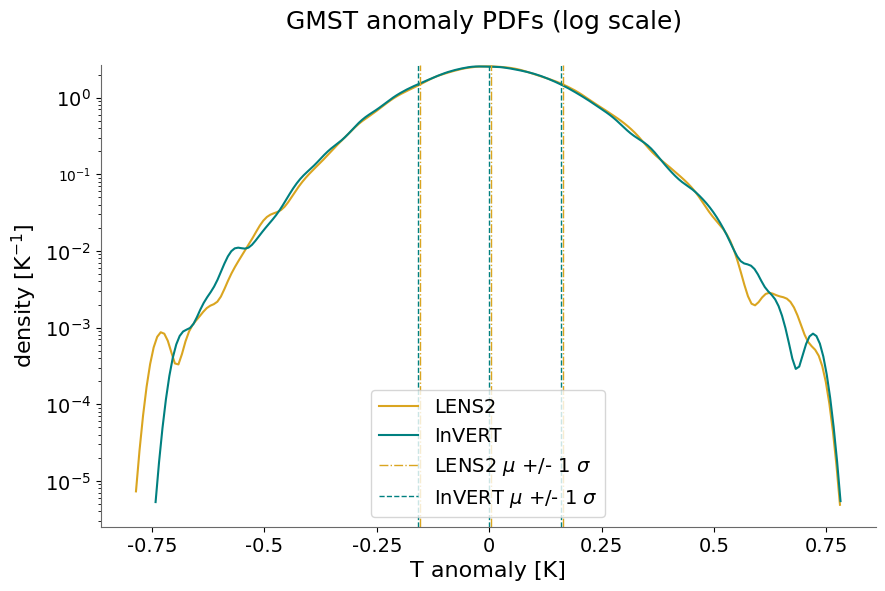

In [50]:
## Figure S19 - Probability distributions of global mean surface temperature anomalies for InVERT 
## As in main text Fig. 2(a) but with a log scale on y-axis to emphasize comparison of distribution tails. 

fig, ax = plt.subplots(1, 1, figsize=(10,6))

compare_T_pdfs(Tanoms_lens.gmean, InVERT_stacked.gmean, 'LENS2', 'InVERT', 
               color1, color2, 'GMST anomaly PDFs (log scale) \n', ax=ax, log_scale=True)

In [51]:
# Calculate the 99th percentile for maximum temperature anomalies at each grid cell
invert_99th_percentile = InVERT_stacked.T.chunk({'time': -1}).quantile(0.99, dim='time')
lens_99th_percentile = Tanoms_lens.anoms.chunk({'time': -1}).quantile(0.99, dim='time')

# Calculate the 1st percentile for minimum temperature anomalies at each grid cell
invert_1st_percentile = InVERT_stacked.chunk({'time': -1}).quantile(0.01, dim='time')
lens_1st_percentile = Tanoms_lens.anoms.chunk({'time': -1}).quantile(0.01, dim='time')

# Save the calculated percentiles (optional)
invert_99th_percentile.to_netcdf(savepath + 'InVERT_99th_percentile.nc')
lens_99th_percentile.to_netcdf(savepath + 'LENS_99th_percentile.nc')
invert_1st_percentile.to_netcdf(savepath + 'InVERT_1st_percentile.nc')
lens_1st_percentile.to_netcdf(savepath + 'LENS_1st_percentile.nc')

In [52]:
## Calculate the difference in the 99th percentile
diff_99th_percentile = invert_99th_percentile - lens_99th_percentile

## Calculate the difference in the 1st percentile
diff_1st_percentile = invert_1st_percentile - lens_1st_percentile

## Save the calculated differences (optional)
diff_99th_percentile.to_netcdf(savepath + 'diff_99th_percentile.nc')
diff_1st_percentile.to_netcdf(savepath + 'diff_1st_percentile.nc')

In [53]:
## Load 1st and 99th percentile differences (saved in previous step)
diff_99th_percentile = xr.open_dataarray(savepath + 'diff_99th_percentile.nc')
diff_1st_percentile = xr.open_dataset(savepath + 'diff_1st_percentile.nc')

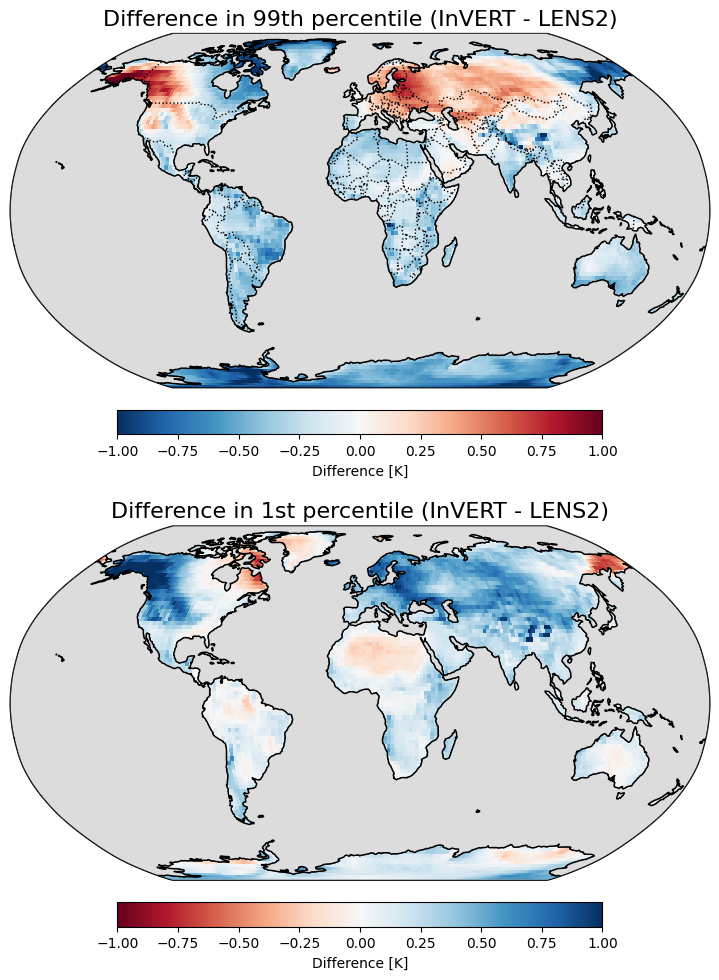

In [54]:
## Create figure and axes for map plots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 10),
                         subplot_kw={'projection': ccrs.Robinson()})

## Plot the difference in the 99th percentile
ax = axes[0]
im1 = ax.pcolormesh(diff_99th_percentile['lon'], diff_99th_percentile['lat'],
                    diff_99th_percentile.values, transform=ccrs.PlateCarree(),
                    cmap='RdBu_r', vmin=-1, vmax=1) # Adjust vmin/vmax as needed
ax.coastlines()
ax.add_feature(cfeature.BORDERS, linestyle=':')
ax.set_title('Difference in 99th percentile (InVERT - LENS2)', fontsize=titlefontsize - 4)
ax.stock_img() # Add stock image to mask ocean
ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='black', facecolor='gainsboro')

## Add a colorbar for the 99th percentile plot
cbar1 = fig.colorbar(im1, ax=ax, orientation='horizontal', pad=0.05, label='Difference [K]',
                     shrink = 0.5)

## Plot the difference in the 1st percentile
ax = axes[1]
im2 = ax.pcolormesh(diff_1st_percentile['lon'], diff_1st_percentile['lat'],
                    diff_1st_percentile.T.values, transform=ccrs.PlateCarree(),
                    cmap='RdBu', vmin=-1, vmax=1) # Adjust vmin/vmax as needed, potentially inverse cmap
ax.coastlines()
ax.set_title('Difference in 1st percentile (InVERT - LENS2)', fontsize=titlefontsize - 4)

## Add a colorbar for the 1st percentile plot
cbar2 = fig.colorbar(im2, ax=ax, orientation='horizontal', pad=0.05, label='Difference [K]',
                     shrink = 0.5)
ax.stock_img() # Add stock image to mask ocean
ax.add_feature(cfeature.OCEAN, zorder=100, edgecolor='black', facecolor='gainsboro')

plt.tight_layout(); plt.show()

fig.savefig(savepath + 'percentile_difference_maps.png')
fig.savefig(savepath + 'percentile_difference_maps.pdf')

## Month-pair PC autocorrelations

In [55]:
invert_pcs = xr.open_dataarray(savepath + 'InVERT_PCs.nc')

invert_pcs_dict = {}
for month in range(1, 13):
    
    invert_month = invert_pcs.where(invert_pcs.month==month, drop=True)
    invert_month['time'] = np.arange(0, len(invert_month.time))
    invert_pcs_dict[month] = invert_month

In [56]:
## Load training EOF solvers by month 

solvers_bymonth = {}
for month in range(1,13):
    solvers_bymonth[month] = calc_EOFs(0, path=savepath, filename='LENS2_' + scenario_name + \
                                       '_monthly_Tanom_EOFs_month='+str(month))
    
## Extract PCs, EOFs, and variance fractions from the number of specified modes 
lens_pcs_dict = {}
for month in range(1, 13):
    lens_pcs_dict[month] = unstack_time(solvers_bymonth[month].pcs().sel(mode=slice(0, nmodes-1)), esize=25)

Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver
Loading EOF solver


In [57]:
def plot_pc_autocorr_subplots(lens_pcs_dict, invert_pcs_dict, nmodes):
    """
    Plots subplots of ensemble mean month-to-month PC autocorrelations with shaded standard deviation.
    - lens_pcs_dict (dict): Dictionary of LENS PCs by month.
    - invert_pcs_dict (dict): Dictionary of InVERT PCs by month.
    - nmodes (int): Number of modes to plot.
    """
    month_pairs = [f'{m}-{m+1 if m<12 else 1}' for m in range(1, 13)]
    nrows = 4; ncols = 3

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15), squeeze=False) 

    ## Flatten axes array for easy iteration
    axes = axes.flatten()

    for i, month_pair_label in enumerate(month_pairs):
        ax = axes[i]
        month1 = int(month_pair_label.split('-')[0])
        month2 = int(month_pair_label.split('-')[1])

        ## Calculate correlations across time for each ensemble and mode
        lens_corrs_ensemble = xr.corr(lens_pcs_dict[month1], lens_pcs_dict[month2], dim='time')
        invert_corrs_ensemble = xr.corr(invert_pcs_dict[month1], invert_pcs_dict[month2], dim='time')

        ## Calculate ensemble mean and standard deviation
        lens_mean_corr = lens_corrs_ensemble.mean('ensemble')
        lens_std_corr = lens_corrs_ensemble.std('ensemble')

        invert_mean_corr = invert_corrs_ensemble.mean('ensemble')
        invert_std_corr = invert_corrs_ensemble.std('ensemble')

        ## Plot line and shaded region for LENS
        x_modes = np.arange(nmodes)
        ax.plot(x_modes, lens_mean_corr.values, color=color1, label='LENS2')
        ax.fill_between(x_modes, lens_mean_corr.values - lens_std_corr.values,
                        lens_mean_corr.values + lens_std_corr.values, color=color1, alpha=0.2)

        ## Plot line and shaded region for InVERT
        ax.plot(x_modes, invert_mean_corr.values, color=color2, label='InVERT')
        ax.fill_between(x_modes, invert_mean_corr.values - invert_std_corr.values,
                        invert_mean_corr.values + invert_std_corr.values, color=color2, alpha=0.2)

        ax.set_title(f'{month_pair_label}', fontsize=titlefontsize-2)
        if i > 8:
            ax.set_xlabel('Mode', fontsize=axislabelfontsize-2)
        if i in [0, 3, 6, 9]:
            ax.set_ylabel('PC autocorrelation', fontsize=axislabelfontsize-2)
        ax.set_yticks([-1, -0.5, 0, 0.5, 1])
        
        ax.grid(True, linestyle='--', alpha=0.6)
        ax.set_ylim(-1, 1); ax.set_xlim(-1, nmodes)

    # Add a single legend to the last subplot (or adjust as needed)
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', fontsize=legendfontsize)

    plt.tight_layout(rect=[0, 0, 0.99, 1]) # Adjust layout to make space for legend
    plt.suptitle('Ensemble Mean Month-to-Month PC Autocorrelation', y=1.02, 
                 fontsize=titlefontsize+2)
    plt.show()
    plt.savefig(savepath + 'Figure_S11_PC_month_pair_autocorrs.png')
    plt.savefig(savepath + 'Figure_S11_PC_month_pair_autocorrs.pdf')

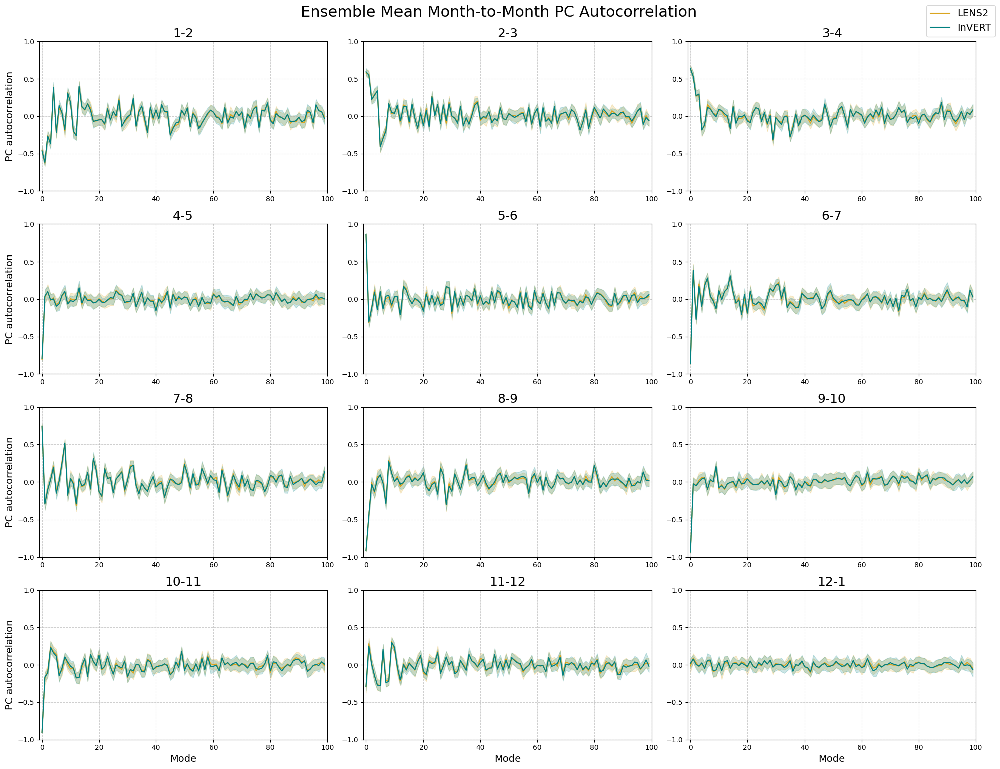

<Figure size 640x480 with 0 Axes>

In [58]:
## Figure S11 - Autocorrelation structure of emulated vs training PCs for month pairs across first 100 modes

plot_pc_autocorr_subplots(lens_pcs_dict, invert_pcs_dict, nmodes)

## Month-pair T anomaly autocorrelations

In [59]:
LENS_gridcell_autocorrs = calc_gridcell_monthly_autocorrs(T_unstacked.anoms)
LENS_gridcell_autocorrs.to_netcdf(savepath + 'LENS_gridcell_autocorrs.nc')

In [60]:
InVERT_gridcell_autocorrs = calc_gridcell_monthly_autocorrs(InVERT_T.T)
InVERT_gridcell_autocorrs.to_netcdf(savepath + 'InVERT_gridcell_autocorrs.nc')

In [14]:
LENS_gridcell_autocorrs = xr.open_dataarray(savepath + 'LENS_gridcell_autocorrs.nc')
InVERT_gridcell_autocorrs = xr.open_dataarray(savepath + 'InVERT_gridcell_autocorrs.nc')

In [21]:
def plot_mean_gridcell_monthly_autocorrs(autocorrs_lens, autocorrs_invert, savepath):
    """
    Plots spatial average of grid cell month-to-month autocorrelations for each month pair for LENS and InVERT.
    - autocorrs_lens (xr.DataArray): LENS grid cell autocorrelations. dims:(month_pair, lat, lon).
    - autocorrs_invert (xr.DataArray): InVERT grid cell autocorrelations. dims=(month_pair, lat, lon).
    """
    # Calculate spatial mean of autocorrelations for each month pair
    average_autocorrs_lens = areaweighted_mean(autocorrs_lens) #autocorrs_lens.mean(dim=('lat', 'lon'))
    average_autocorrs_invert = autocorrs_invert.mean(dim=('lat', 'lon'))

    month_pairs = autocorrs_lens['month_pair'].values

    fig, ax = plt.subplots(figsize=(12, 6))

    # LENS
    ax.scatter(month_pairs, average_autocorrs_lens.values, color=color1, label='LENS2', s=50, zorder=5)
    # InVERT
    ax.scatter(month_pairs, average_autocorrs_invert.values, color=color2, label='InVERT', s=50, zorder=5)

    ax.set_xlabel('Month pair', fontsize=axislabelfontsize)
    ax.set_ylabel('Average grid cell autocorrelation', fontsize=axislabelfontsize)
    ax.set_title('Average grid cell month-to-month autocorrelations', fontsize=titlefontsize)
    ax.set_xticks(np.arange(len(month_pairs)))
    ax.set_xticklabels(month_pairs, rotation=45, ha='right', fontsize=tickfontsize)
    ax.tick_params(axis='y', labelsize=tickfontsize)
    ax.legend(fontsize=legendfontsize)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.set_ylim(0, 1)

    plt.tight_layout(); plt.show()
    plt.savefig(savepath + 'Figure_S12_average_gridcell_monthly_autocorrs.png')
    plt.savefig(savepath + 'Figure_S12_average_gridcell_monthly_autocorrs.pdf')

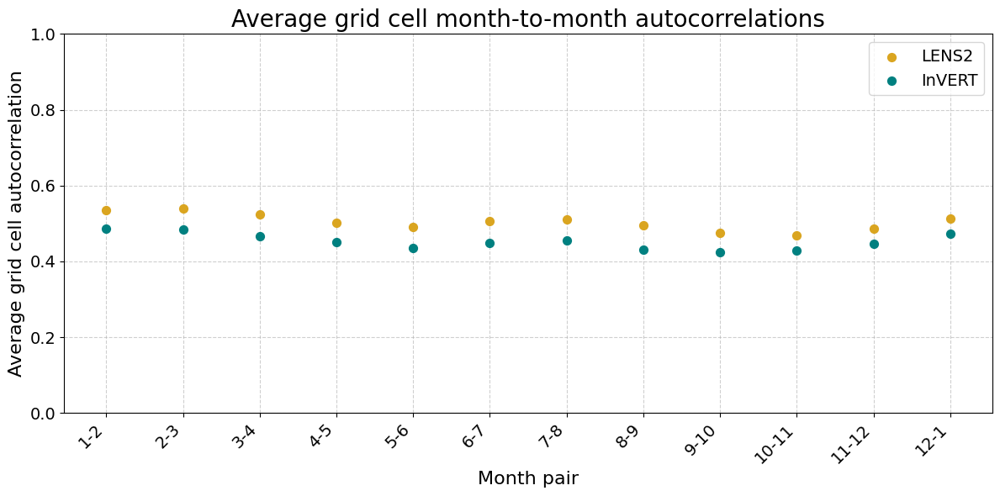

<Figure size 640x480 with 0 Axes>

In [22]:
## Figure S12: Month-to-month spatially averaged temperature anomaly autocorrelation values

plot_mean_gridcell_monthly_autocorrs(LENS_gridcell_autocorrs, InVERT_gridcell_autocorrs, savepath)